# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

### Исполнитель: Васильев А. Н.

In [1]:
# !pip install ydata-profiling -q

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import pickle
import json
from itertools import combinations
import re
import phik
from phik import report

from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, Ridge
from sklearn.metrics import r2_score, mean_squared_error as MSE
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, PolynomialFeatures
import warnings

warnings.filterwarnings('ignore')

random.seed(42)
np.random.seed(42)

%matplotlib inline

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Это делается для воспроизводимости экспериментов.

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [X] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [X] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [X] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [X] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

Проверяю вначале df_train

In [4]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


In [5]:
values_for_form = {col: df_train[col].unique().tolist() if df_train[col].dtype in ('object', 'bool') else df_train[col].median() for col in df_train.columns}

In [6]:
# Сохраняю изначальный список признаков и их типы для использования в приложении на streamlit
with open('./data/main_columns.json', 'w') as f:
    json.dump(list(df_train.columns), f)

with open('./data/features_base_dtypes.pkl', 'wb') as f:
    pickle.dump(df_train.dtypes, f)

with open('./data/values_for_form.json', 'w') as f:
    json.dump(values_for_form, f)

In [7]:
df_train.drop('selling_price', axis=1).select_dtypes('number').corrwith(df_train['selling_price']).reset_index()

,index,0
0,year,0.413242
1,km_driven,-0.222218
2,seats,0.038512


In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [9]:
# Проверка на пропуски в данных
df_train.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

In [10]:
# Проверка на дубликаты
df_train.duplicated().sum()

np.int64(985)

Аналогично проверю df_test

In [11]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [12]:
df_test_to_plot = df_test.copy()

In [13]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


In [14]:
df_test.isna().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

In [15]:
df_test.duplicated().sum()

np.int64(62)

Построю дашборд по df_train

In [16]:
report_train = ProfileReport(df_train, title="Profiling Report of df_train")
report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 153.33it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Построю также дашборд по df_test

In [17]:
report_test = ProfileReport(df_test, title="Profiling Report of df_test")
report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 316.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**  
1. Датасет df_train созержит 6999 строк-объектов, из которых 985 являются полными дубликатами других строк. Также в нем есть пропуски в данных у следующих столбцов: mileage, engine, max_power, torque и seats  
2. Датасет df_test созержит 1000 строк, из которых 62 строки являются полными дубликатами других. Также в нем есть пропуски в данных в тех же столюцах ,что и у df_train
  
Наибольшая корреляция с целевой переменной selling_price наблюдается у year, что логично, т.к. чем старше авто, тем он дешевле. Также достаточно высокая корреляция у transmission.  
Если рассматривать корреляцию только между признаками, то наибольшая между km_driven и year.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [X] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [X] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [X] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [X] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

Рассчитаю статистики числовых столбцов

In [18]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [19]:
df_test.describe()

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


Расситываю основные статистики для категориальных столбцов

In [20]:
df_train.describe(include=['object'])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [21]:
df_test.describe(include=['object'])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


**Выводы:**  
Средние значения в обоих датасетах примерно равны, что говорит в целом о качественном разделении данных на train и test.  
В train_df мединаное значение у year выше на 1 год, чем в test_df. Это говорит, что в тесте больше автомобилей до 2014 года включительно, чем в трейне. Это же подтверждают значения km_driven - медианный пробег также немного больше у тестовых данных. Но в целом говорить что данные не сбалансированны нельзя.  
Максимальное значение km_driven в тренировочном датасете на порядок выше, чем в тестовом. Стоит в дальнейшем присмотреться в этим значениям в трейне повнимательнее - чем вызвано такое высокое значене.
У категориальных признаков видно, что и в трейне, и в тесте наиболее часто встречающиеся значения практически по всем столбцам совпадают. Это также подтверждает мой вывод о том, что данные были разбиты качественно.

### **Задание 3 (0.2 балла)**

- [X] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [X] Отобразите такие объекты (0.01 балла)
- [X] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [X]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [X] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [22]:
df_train.drop('selling_price', axis=1).duplicated().sum()

np.int64(1159)

В трейне присутствует 1159 строк с одинаковым признаковым описанием.  
Удалю их из данных

In [23]:
idxs_to_drop = df_train.drop('selling_price', axis=1).duplicated(keep='first')
df_train = df_train.loc[~idxs_to_drop, :].reset_index(drop=True)
print(df_train.shape)
df_train.head()

(5840, 13)


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


In [24]:
assert df_train.shape == (5840, 13)

In [25]:
df_train.columns[(df_train.isna().sum() > 0)]

Index(['mileage', 'engine', 'max_power', 'torque', 'seats'], dtype='object')

**Выводы:** Я удалил полные дубли в данных. Но могут быть дубли и по отдельным наборам признаков. Например если бы в данных присутствовали бы ID продаваемых автомобилей и коды продавцов, в которых они продаются, то можно было бы проверить наличие дубликатов только по этим двум признакам. Для этого у функции `duplicates` есть параметр `subset` для указания подмножества полей, по которым нужно проверить данные на дубли. Для приведенного мной примера команда для поиска таких дублей может выглядеть так: `df.duplicates(subset=['id', 'seller_id'])`,- либо сразу для их удаления: `df.drop_duplicates(['id', 'seller_id'])`

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [X] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [X] Приведите тип данных к ``float``.
* [X] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [26]:
df_train[['mileage', 'engine', 'max_power', 'torque']]

,mileage,engine,max_power,torque
0,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
1,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm
2,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm
3,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)"
4,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm
...,...,...,...,...
5835,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm
5836,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm
5837,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm
5838,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)"


In [27]:
df_train.columns[(df_train.isna().sum() > 0)]

Index(['mileage', 'engine', 'max_power', 'torque', 'seats'], dtype='object')

In [28]:
def convert_to_float(val):
    if val is not np.nan:
        splitted_val = val.split()
        val_to_convert = splitted_val[0] if splitted_val else '0'
        if not val_to_convert.isalpha():
            return float(val_to_convert)
        else:
            return 0.0

In [29]:
for col_ in ['mileage', 'engine', 'max_power']:
    df_train[col_] = df_train[col_].apply(convert_to_float)
    df_test[col_] = df_test[col_].apply(convert_to_float)

In [30]:
df_train[['mileage', 'engine', 'max_power', 'torque']].head(20)

,mileage,engine,max_power,torque
0,23.40,1248.0,74.00,190Nm@ 2000rpm
1,21.14,1498.0,103.52,250Nm@ 1500-2500rpm
2,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm
3,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)"
4,20.14,1197.0,81.86,113.75nm@ 4000rpm
5,17.30,1061.0,57.50,"7.8@ 4,500(kgm@ rpm)"
6,16.10,796.0,37.00,59Nm@ 2500rpm
7,23.59,1364.0,67.10,170Nm@ 1800-2400rpm
8,20.00,1399.0,68.10,160Nm@ 2000rpm
9,19.01,1461.0,108.45,248Nm@ 2250rpm


In [31]:
df_train.columns[(df_train.isna().sum() > 0)]

Index(['mileage', 'engine', 'max_power', 'torque', 'seats'], dtype='object')

Реализовал 2 варианта обработки данных в `torque`.  
В первом использовал регулярные выражения - этот вариант короче, но т.к. регуляркой вытягиваются только числа, потом сложно понять где какие единицы измерения были. Если единицы измерения не вожны, то этот вариант удобнее.  
Второй вариант на правилах - он более громоздкий, но учитывает единицы изменения значений (переводит kgm в nm).

In [32]:
# Не учитывает значения kgm в левой части, которые перевожу в Nm, чтобы была одна размерность.

pattern = r'\d+[.,]*\d*'

print(np.unique([len(re.findall(pattern, str(el))) for el in df_train['torque'].to_list()]))

def convert_to_float(val):
  if ',' in val:
    val = ''.join(val.split(','))
  elif '.' in val:
    val = ''.join(val.split('.'))
  return float(val)


def parce_torque(value):
  try:
    torque, max_torque_rpm = None, None
    parsed_value = re.findall(pattern, str(value))
    if len(parsed_value) == 1:
        torque = int(convert_to_float(parsed_value[0]))
    elif len(parsed_value) == 2:
        torque = int(convert_to_float(parsed_value[0]))
        max_torque_rpm = int(convert_to_float(parsed_value[1]))
    elif len(parsed_value) == 3:
        torque = int(convert_to_float(parsed_value[0]))
        if int(convert_to_float(parsed_value[1])) > int(convert_to_float(parsed_value[2])):
            max_torque_rpm = int(convert_to_float(parsed_value[1])) + int(convert_to_float(parsed_value[2]))
        else:
            max_torque_rpm = int(convert_to_float(parsed_value[2]))
  except ValueError:
     print(value)
  return torque, max_torque_rpm

cleaned_torque_train_v2 = df_train['torque'].apply(parce_torque)
cleaned_torque_train_v2.head()

[0 1 2 3]


0      (190, 2000)
1      (250, 2500)
2      (224, 2750)
3      (115, 4500)
4    (11375, 4000)
Name: torque, dtype: object

In [33]:
# Учитывает значения kgm в левой части, которые перевожу в Nm, чтобы была одна размерность.

def convert_to_float(val):
  if ',' in val:
    val = ''.join(val.split(','))
  elif '.' in val:
    val = ''.join(val.split('.'))
  return float(val)


def parce_2_part(value):
  if '+' in value:
    splitted_values = value.strip().split('+')
    splitted_val_1 = convert_to_float(splitted_values[0])
    splitted_val_2 = convert_to_float(splitted_values[1].split('rpm')[0].strip().split('-')[1].strip())
    max_torque_rpm = splitted_val_1 + splitted_val_2
  elif '-' in value:
      max_torque_rpm = max([convert_to_float(val.strip())
        for val in value.lower().split('rpm')[0].split('-')
        if convert_to_float(val.strip())])
  elif '~' in value:
    max_torque_rpm = max([convert_to_float(val.strip())
      for val in value.lower().split('rpm')[0].split('~')
      if convert_to_float(val.strip())])
  else:
    max_torque_rpm = convert_to_float(
        value.lower().split('rpm')[0].strip())
  return max_torque_rpm


def parce_torque(value):
  if (value is None) | (value is np.nan) | (value == ''):
    return None, None

  try:
    # Обрабатываю разные варианты разделителей
    if '@' in value:
      split_sign = '@'
    elif 'at' in value:
      split_sign = 'at'
    elif '/' in value:
      split_sign = '/'
    else:
      if 'nm' in value.lower():
        return convert_to_float(value.lower().split('nm')[0].strip()), None
      else:
        raise ValueError(f'Unknoun split sign: {value}')

    splitted_value = value.split(split_sign)
    # Обрабатываю 1 часть строки:
    value_1 = splitted_value[0]
    if 'nm' in value_1.lower():
      torque = convert_to_float(value_1.lower().split('nm')[0].strip())
    elif 'kgm' in value_1.lower():
      torque = convert_to_float(
          value_1.lower().split('kgm')[0].strip()) * 9.80665
    elif '(' in value_1:
      torque = convert_to_float(value_1.split('(')[0].strip())
    else:
      torque = convert_to_float(value_1.strip()) * 9.80665

    # Обрабатываю 2 часть строки:
    value_2 = splitted_value[1:]
    if len(value_2) > 1:
      value_2 = value_2[0].lower().split('(')[0].strip()
      max_torque_rpm = parce_2_part(value_2)
    else:
      value_2 = value_2[0]
      max_torque_rpm = parce_2_part(value_2)
  except Exception as e:
    print(e)
    print(value)
  else:
    return torque, max_torque_rpm

In [34]:
cleaned_torque_train = df_train['torque'].apply(parce_torque)
cleaned_torque_train.head()

0                 (190.0, 2000.0)
1                 (250.0, 2500.0)
2    (2196.6895999999997, 2750.0)
3    (1127.7647499999998, 4500.0)
4               (11375.0, 4000.0)
Name: torque, dtype: object

In [35]:
cleaned_torque_train_df = pd.DataFrame(cleaned_torque_train.to_list(), columns=['torque', 'max_torque_rpm'])
cleaned_torque_train_df.head()

,torque,max_torque_rpm
0,190.00000,2000.0
1,250.00000,2500.0
2,2196.68960,2750.0
3,1127.76475,4500.0
4,11375.00000,4000.0


In [36]:
df_train = pd.concat([df_train.drop('torque', axis=1), cleaned_torque_train_df], axis=1)
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0,190.00000,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0,250.00000,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0,2196.68960,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0,1127.76475,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0,11375.00000,4000.0


In [37]:
cleaned_torque_test = df_test['torque'].apply(parce_torque)
cleaned_torque_test_df = pd.DataFrame(cleaned_torque_test.to_list(), columns=['torque', 'max_torque_rpm'])
df_test = pd.concat([df_test.drop('torque', axis=1), cleaned_torque_test_df], axis=1)
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,7.0,260.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,5.0,260.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9,1799.0,130.0,5.0,172.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1,1498.0,98.6,5.0,200.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5,1172.0,65.0,5.0,96.0,3000.0


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [X] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [X] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [X] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [38]:
cols_with_na = list(df_train.columns[(df_train.isna().sum() > 0)])
cols_with_na

['mileage', 'engine', 'max_power', 'seats', 'torque', 'max_torque_rpm']

In [39]:
# Сохраняю cols_with_na (понадобится для приложения на streamlit)
with open("./data/cols_with_na.json", 'w') as f:
    json.dump(cols_with_na, f)

In [40]:
# Сохраняю маски полей, которые были с пропущенными значениями, по каждому из заполняемых признаков 
na_values_mask_train = {col: df_train[col].isna() for col in cols_with_na}
na_values_mask_test = {col: df_test[col].isna() for col in cols_with_na}

In [41]:
# На трейне определяю медиану по каждому столбцу
na_fill_mapping = {col: df_train[col].median() for col in cols_with_na}
na_fill_mapping

{'mileage': np.float64(19.369999999999997),
 'engine': np.float64(1248.0),
 'max_power': np.float64(81.86),
 'seats': np.float64(5.0),
 'torque': np.float64(196.0),
 'max_torque_rpm': np.float64(3000.0)}

In [42]:
# Сохраняю na_fill_mapping (понадобится для приложения на streamlit)
with open("./data/na_fill_mapping.json", 'w') as f:
    json.dump(na_fill_mapping, f)

In [43]:
# Заполняю пропуски в данных медиаными значениями, рассчитанными на трейне
df_train.fillna(na_fill_mapping, inplace=True)
df_test.fillna(na_fill_mapping, inplace=True)

In [44]:
df_train.isna().sum().sum(), df_test.isna().sum().sum()

(np.int64(0), np.int64(0))

**Ответы на вопросы**  
**Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.**  
Мединана более устойчива к выбросам в данных, поэтому если в значениях признака есть какие-то нетипичные значения, то они не увеливат смещение заполненных данных, а отличии от заполнения средними значениями.  
**Как правильно считать медиану для заполнения?**  
По тренировочным данным для `train` и `test`

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [X] Осуществите приведение столбцов к необходимому типу.
- [X] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [45]:
df_train['seats'] = df_train['seats'].astype('int')
df_test['seats'] = df_test['seats'].astype('int')

df_train['seats'].dtype, df_test['seats'].dtype

(dtype('int64'), dtype('int64'))

In [46]:
df_train['seats'].unique()

array([ 5,  4,  7,  8,  6,  9, 10, 14,  2])

**Ответ на вопрос**  


Количество сидений - это дискретная величина, имеющая конечное количество возможных значений. Поэтому возможно рассматривать ее как категориальную переменную.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [X] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [47]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats,torque,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.892354,5.426712,896.887547,3046.645205
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.661223,0.982344,2749.071484,912.076209
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000,51.000000,1400.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000,115.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,5.000000,196.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000,330.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000,43639.000000,21800.000000


In [48]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats,torque,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,5.403000,937.474545,3099.776000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,0.912921,2931.773126,878.545644
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,4.000000,48.000000,1500.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,5.000000,114.000000,2500.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,5.000000,200.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,5.000000,360.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,9.000000,25987.000000,5200.000000


Я думаю, что заполнение пропусков медианой все равно может повлиять на итоговое распределение данных признаков, хотя и в меньшей степени по сравнению с заполнением пропусков средними значениями. Это произойдет потому, что мы добавляем новые значения в данные. Новые медианные значения не должны сдвинуть среднее выборки, но может поменять его форму.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [X] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [X] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [X] Постройте pairplot по тестовым данным
- [X] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

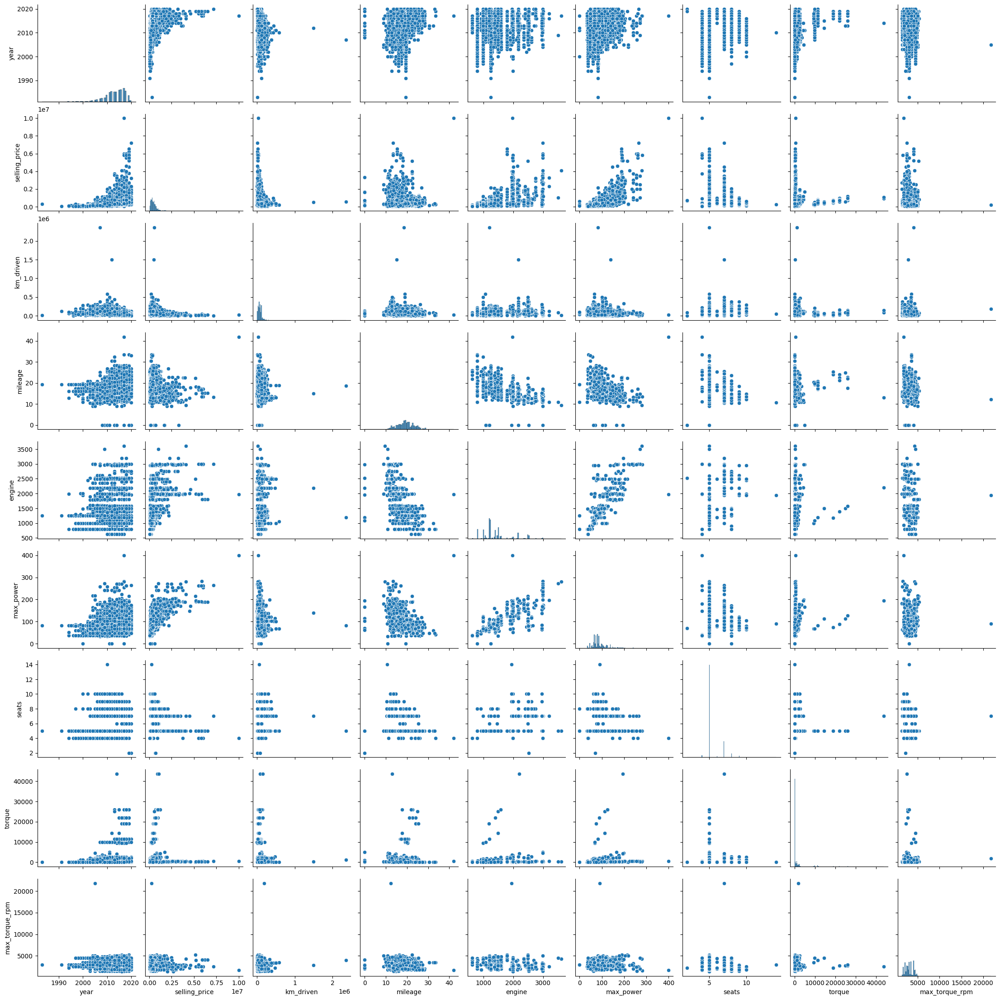

In [49]:
sns.pairplot(data=df_train);

**Ответы на вопросы:**  
**Можно ли предположить на основе распределений связь признаков с целевой переменной?**  
Судя по визуализации распределений, я не наблюдаю каких-либо явных зависимостей между признаками и целевой переменной. Либо она неявная и желательно дополнительно проверить наличие линейных зависимостей с помощью корреляционной матрицы.  
**Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?**  
Да. Из графиков вижу явную линейную зависимость между признаками engine и max_power. Поэтому могу видвинуть гипотизу, что между этими пригнаками есть линейная зависимость.

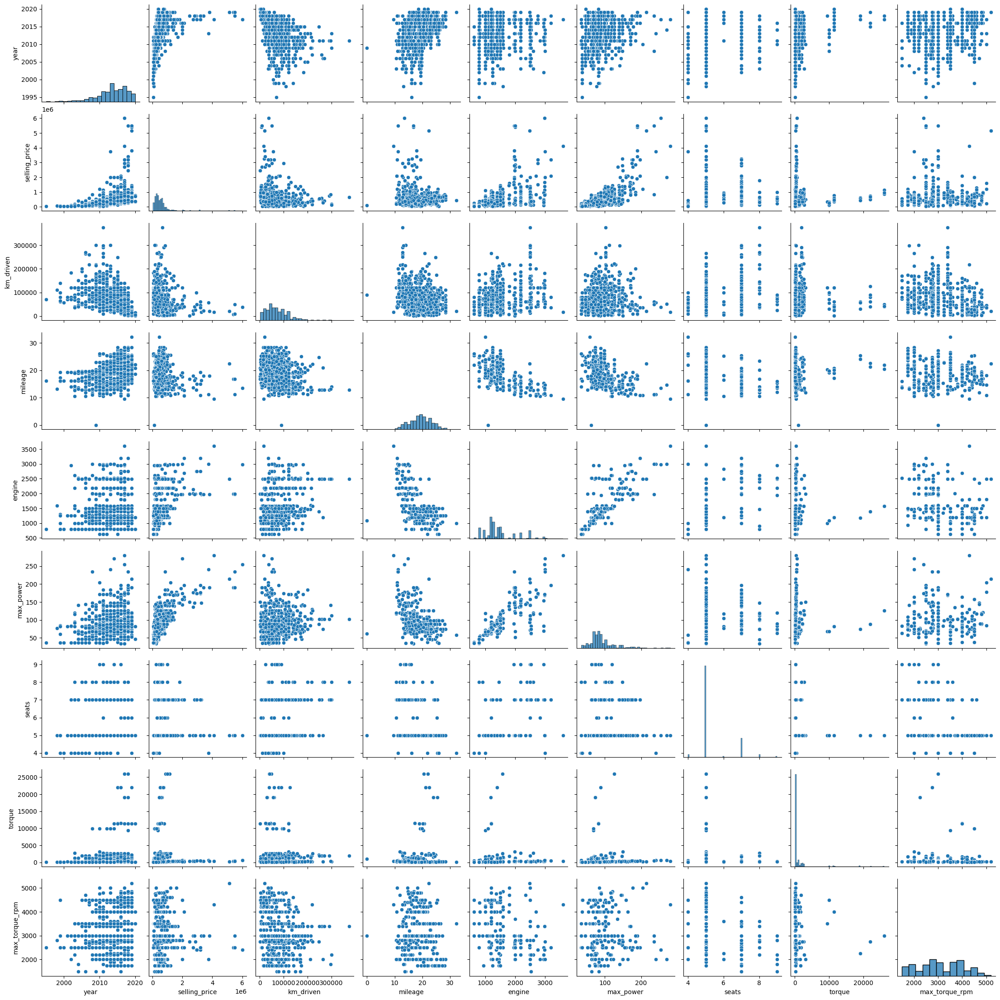

In [50]:
sns.pairplot(data=df_test);

**Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"**  
В целом да. В тренировочных данных присутствуют более высокие значения в некоторых признаках (например в `max_torque_prm`), которых нет в тесте, но это единичные случаи, поэтому могу утверждать, что распределения данных в трейне и тесте похожи.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [X] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [X] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

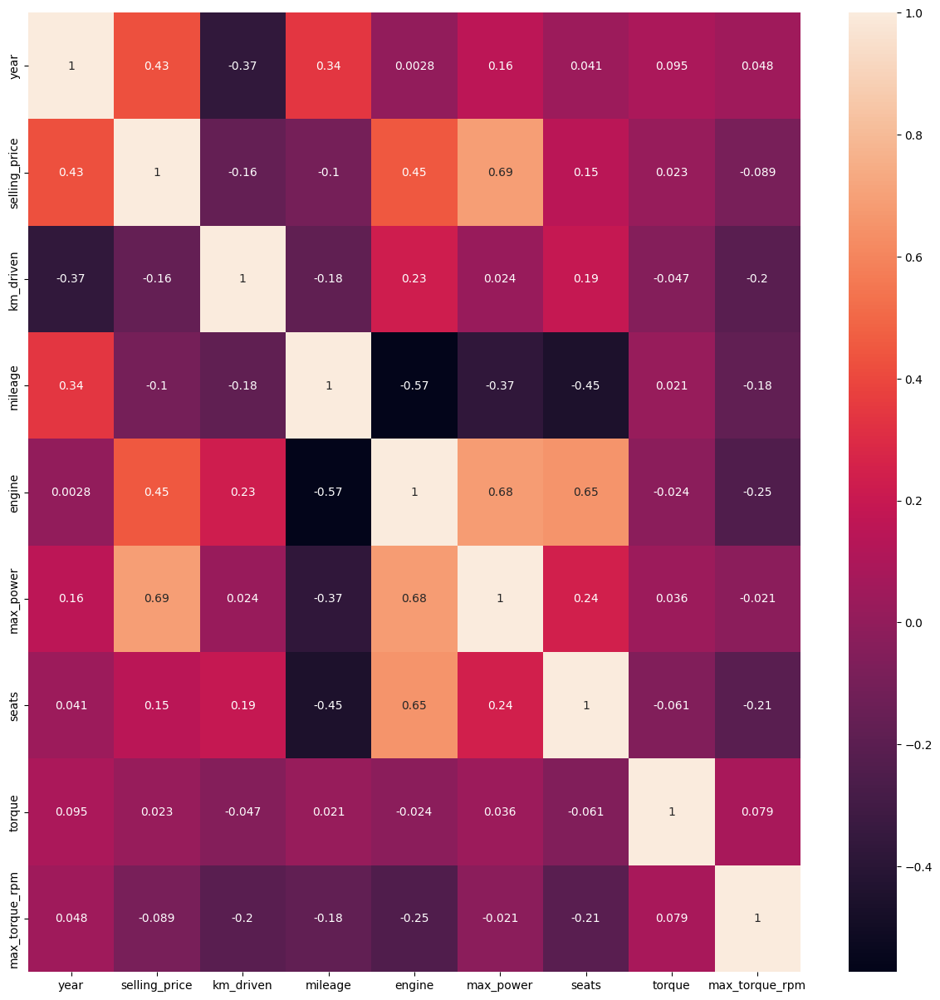

In [51]:
corr = df_train.select_dtypes('number').corr()

plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True);

In [52]:
corr.abs().min().sort_values().head(2)

year      0.002819
engine    0.002819
dtype: float64

In [53]:
corr.abs().query("@corr.abs() != 1").max().sort_values(ascending=False)

selling_price     0.692725
max_power         0.692725
engine            0.681247
seats             0.652172
mileage           0.572893
year              0.427279
km_driven         0.368966
max_torque_rpm    0.246207
torque            0.094885
dtype: float64

- [X] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

**Какие 2 признака наименее скоррелированы между собой?**  
Это `year` и `year`.  
  
**Между какими наблюдается довольно сильная положительная линейная зависимость?**  
Наибольшая линейная взаимосвязь наблюдается между `engine` и `seats`. Это может быть связано с тем, что обычно чем больше сидений в автомобиле, тем он больше размером и, следовательно, в него устанавливают более мощный двигатель. Также, как выдвигал гипотизу ранее, достаточно высокая взаимосвязь межлу признаками `engine` и `max_power`. С целевой переменной высокая линейная зависимость у `engine` и `year`.  
  
**Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?**  
Да, это корректное утверждение, т.к. зависимость между признаками `year` и `km_driven` равна -0.37. Эта зависимость - отрицательная, а значит у признаков она обратная - чем больше один из признаков (`year`), тем ниже другой (`km_driven`).  

**Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?**  
Всего метод `df.corr()` может рассчитать 3 типа корреляций: 'pearson', ‘kendall', 'spearman'. Но по умолчанию рассчитывается корреляция Пирсона.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [X] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [X] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [X] Проинтерпретируйте результаты


Решил реализовать корреляцию Спирмена. Но использую только numpy столкнулся с трудностью как без циклов посчитать средние ранги совпадающих элементов. Поэтому воспользовался помощью `Deepseek` - функция `spearman_correlation` написана им. Но ниже я сделал реализацию этой же корреляции на pandas (без использования метода `pd.DataFrame.corr`) - `spearman_rank`. Результаты обоих функций имеют небольшие различия, но до 2 знака после запятой сходятся.  
  
Алгоритм расчета корреляции Спирмена следующий:  
- Сортируем данные по возрастанию по значениям признака `x`
- Проставляем ранги каждой строке. Если значения признака `x` одинаковые у нескольких строк, то указываем их среднее значение
- Снова сортируем данные по возрастанию по значениям признака `y` и тоже проставляем ранги
- Рассчитываем сумму квадратов разности рангов признаков: $\sum_{i=0}^n (rank_x - rank_y)^2$
- Находим коэффициент кореляции по следующей формуле:
$$1 - \frac{6 \cdot \sum_{i=0}^n (rank_x - rank_y)^2}{n \cdot (n^2 - 1)}$$

In [54]:
from typing import Union, Tuple

def spearman_correlation(
    x: Union[np.ndarray, list], 
    y: Union[np.ndarray, list],
    nan_policy: str = 'propagate'
) -> Tuple[float, float]:
    """
    Calculate Spearman's rank correlation coefficient and p-value.
    
    Parameters:
    -----------
    x, y : array-like
        Input arrays of the same length
    nan_policy : str, optional
        How to handle NaN values ('propagate', 'omit')
    
    Returns:
    --------
    correlation : float
        Spearman's rank correlation coefficient
    p_value : float
        Two-tailed p-value
    
    Raises:
    -------
    ValueError
        If inputs have different lengths or invalid nan_policy
    """
    
    # Convert inputs to numpy arrays
    x = np.asarray(x)
    y = np.asarray(y)
    
    # Validate inputs
    if len(x) != len(y):
        raise ValueError("Input arrays must have the same length")
    
    if nan_policy not in ['propagate', 'omit']:
        raise ValueError("nan_policy must be 'propagate' or 'omit'")
    
    # Handle NaN values
    if nan_policy == 'omit':
        mask = ~(np.isnan(x) | np.isnan(y))
        x = x[mask]
        y = y[mask]
        if len(x) < 2:
            return np.nan, np.nan
    
    n = len(x)
    
    # Calculate ranks
    def get_ranks(arr):
        # Sort and get indices that would sort the array
        sorted_indices = np.argsort(arr)
        
        # Create ranks array
        ranks = np.empty_like(sorted_indices)
        ranks[sorted_indices] = np.arange(len(arr))
        
        # Handle ties by assigning average rank
        _, unique_inverse, counts = np.unique(arr, return_inverse=True, return_counts=True)
        
        # Calculate cumulative counts for average rank calculation
        cumulative_counts = np.cumsum(counts)
        start_indices = np.concatenate(([0], cumulative_counts[:-1]))
        
        # Calculate average ranks for each unique value
        average_ranks = (start_indices + cumulative_counts - 1) / 2.0 + 1
        
        # Assign average ranks to all elements
        ranks = average_ranks[unique_inverse]
        
        return ranks
    
    rank_x = get_ranks(x)
    rank_y = get_ranks(y)
    
    # Calculate differences between ranks
    d = rank_x - rank_y
    
    # Calculate Spearman's rho
    # Method 1: Using the standard formula with rank differences
    sum_d_squared = np.sum(d ** 2)
    
    # Handle cases where all ranks are the same
    if np.all(rank_x == rank_y):
        return 1.0, 0.0
    
    # Calculate correlation coefficient
    if len(np.unique(rank_x)) == 1 or len(np.unique(rank_y)) == 1:
        correlation = 0.0
    else:
        correlation = 1 - (6 * sum_d_squared) / (n * (n ** 2 - 1))
    
    # Alternative method using Pearson correlation on ranks (more robust)
    # This handles ties better and is equivalent to the standard definition
    correlation_alt = np.corrcoef(rank_x, rank_y)[0, 1]
    
    # Use the alternative method as it's more numerically stable
    correlation = correlation_alt
    
    # Calculate p-value using t-distribution approximation
    if n > 2 and abs(correlation) < 1:
        t_statistic = correlation * np.sqrt((n - 2) / (1 - correlation ** 2))
        # Two-tailed p-value using t-distribution
        from scipy.stats import t as t_dist
        p_value = 2 * (1 - t_dist.cdf(abs(t_statistic), n - 2))
    else:
        p_value = 0.0 if n == 2 else np.nan
    
    return float(correlation), float(p_value)

In [55]:
# Кореляция между признаками engine и max_power
spearman_correlation(df_train['engine'], df_train['max_power'])

(0.7134351247286151, 0.0)

In [56]:
def spearman_rank(x: pd.Series, y: pd.Series) -> float:
    """Рассчитывает коэффицент корреляции Спирмена"""
    assert x.shape[0] == y.shape[0], 'The arrays have different lengths!'

    df = pd.concat([x, y], axis=1)
    columns = list(df.columns)

    diffs_df = (
        df
        .sort_values(columns[0])
        .assign(x_rank=lambda df_: df_[columns[0]].rank())
        .sort_values(columns[1])
        .assign(y_rank=lambda df_: df_[columns[1]].rank(),
                diff=lambda df_: (df_['x_rank'] - df_['y_rank']).pow(2))
    )
    
    n = diffs_df.shape[0]
    return 1 - (6 * diffs_df['diff'].sum()) / (n * (n**2 - 1))

In [57]:
# Используя функцию combinations из модуля itertools перебираю все комбинации столбцов из df_train

spearman_corr_list = []
for col_x, col_y in combinations(df_train.select_dtypes('number').columns, 2):
    spearman_corr_list.append({
        'col_x': col_x,
        'col_y': col_y,
        'coeff': spearman_rank(df_train[col_x], df_train[col_y])
    })
spearman_corr_df = pd.DataFrame(spearman_corr_list)

In [58]:
# Выведу топ-5 пар столбцов с наибольшей корреляцией
spearman_corr_df.sort_values('coeff', ascending=False).head()

,col_x,col_y,coeff
26,engine,max_power,0.714353
0,year,selling_price,0.708146
27,engine,seats,0.624671
11,selling_price,max_power,0.612708
31,max_power,torque,0.504253


In [59]:
# Кореляция между признаками engine и max_power
corr.loc['engine', 'max_power']

np.float64(0.6812467808914171)

Используя корреляцию Спирмена установил, что наибольшую взаимосвязь имеют столбцы `engine` и `max_power`.  
Для сравнения по корреляции Пирсона их корреляция также была высокой - 0.6812.

In [60]:
df_train.phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats', 'torque', 'max_torque_rpm']


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque,max_torque_rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997908,0.999985,0.999995,0.999946
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.388533,0.288178,0.123577,0.269787
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.196447,0.000000,0.204000
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.096223,0.000000,0.049779
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236798,0.450714,0.163758,0.564479
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331959,0.032173,0.080825,0.149248
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511888,0.045734,0.078657,0.030724
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121828,0.046741,0.037426,0.111955
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687158,0.679979,0.230907,0.311541
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.721079,0.603400,0.258906,0.641002


Матрица корреляций phik позволяет посчитать корреляцию между всеми признаками, включая категориальные.  
По построенной матрице хорошо видно, что между признаками `selling_price` и `name` высокая положительная корреляция `0.995`.  
Также есть пара признаком, также имеющих высокую корреляцию с `name`: mileage и year - 0.999 и 0.949 соорветственно. Но корректность значений этих корреляций у меня вызывают сомнения - слишком высокие. корреляция между ними определенно есть - некоторые модели могут уже не производиться и уже это говорит нам, что у них большой пробег и возраст, как и обратная ситуация - модель только появилась у производителя и  они все с небольшим пробогом и возрастом.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

Матрица корреляций - это удобный инструмент для анализа зависимостей в данных, но хочется отдельно посмотреть корреляцию признаком именно с целевой переменной. Рассчитаю корреляцию Кендалла, т.к. ее ещё не смотрел.

In [61]:
(
    df_train.drop('selling_price', axis=1)
    .select_dtypes('number')
    .corrwith(df_train['selling_price'], method='kendall')
    .sort_values(ascending=False)
)

year              0.538725
max_power         0.447668
engine            0.334230
seats             0.255972
torque            0.221516
mileage           0.030274
max_torque_rpm   -0.082496
km_driven        -0.200974
dtype: float64

In [62]:
corr.loc['selling_price', 'year']

np.float64(0.4272794238196039)

По результату видно, что наибольшая корреляция с целевой переменной у признака `year`, что кажется вполне логичным, т.к. чем старше автомобиль, тем он дешевле. Данный результат отличается от корреляций Пирсона - там наибольшая взаимосвязь с `max_power` со значением 0.693.
Также интересно было бы просмотреть распределение целевой переменной. Построю `histplot`

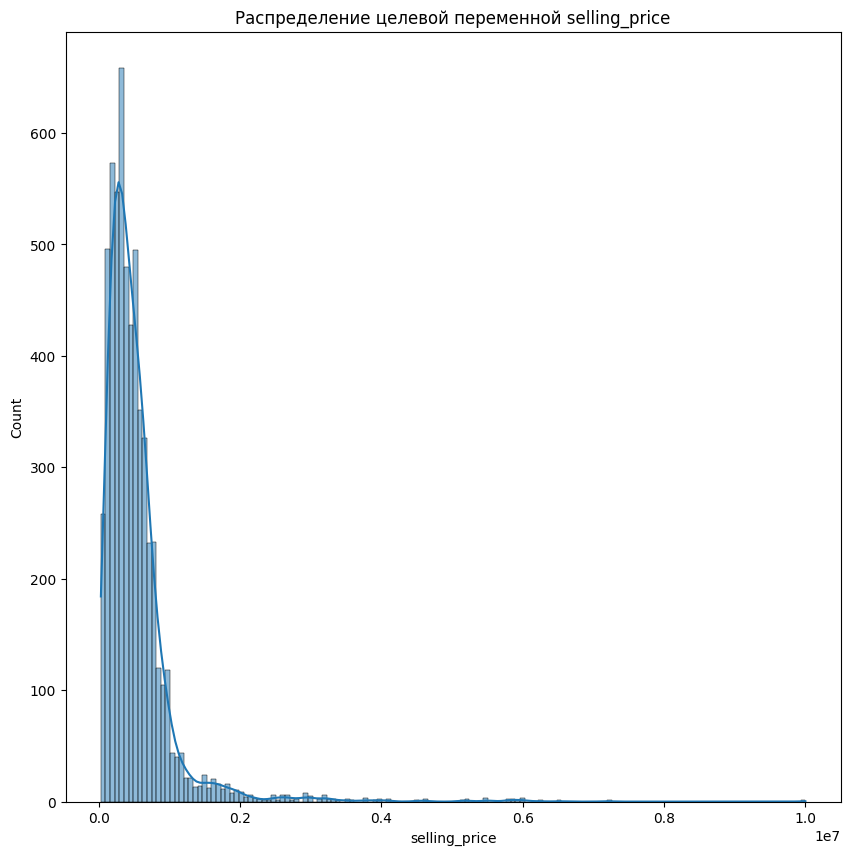

In [63]:
plt.figure(figsize=(10, 10))

sns.histplot(data=df_train, x='selling_price', kde=True)

plt.title('Распределение целевой переменной selling_price')
plt.show()

На гистограмме видно, что распределение целевой переменной сильно смещено влево. Это говорит о том, что в датасете преобладают автомобили низкой и средней ценовых категорий.  
Для "исправления" такого распределения можно попробовать пролагорифмировать целевую переменную.

In [64]:
df_train['selling_price_log'] = np.log(df_train['selling_price'])

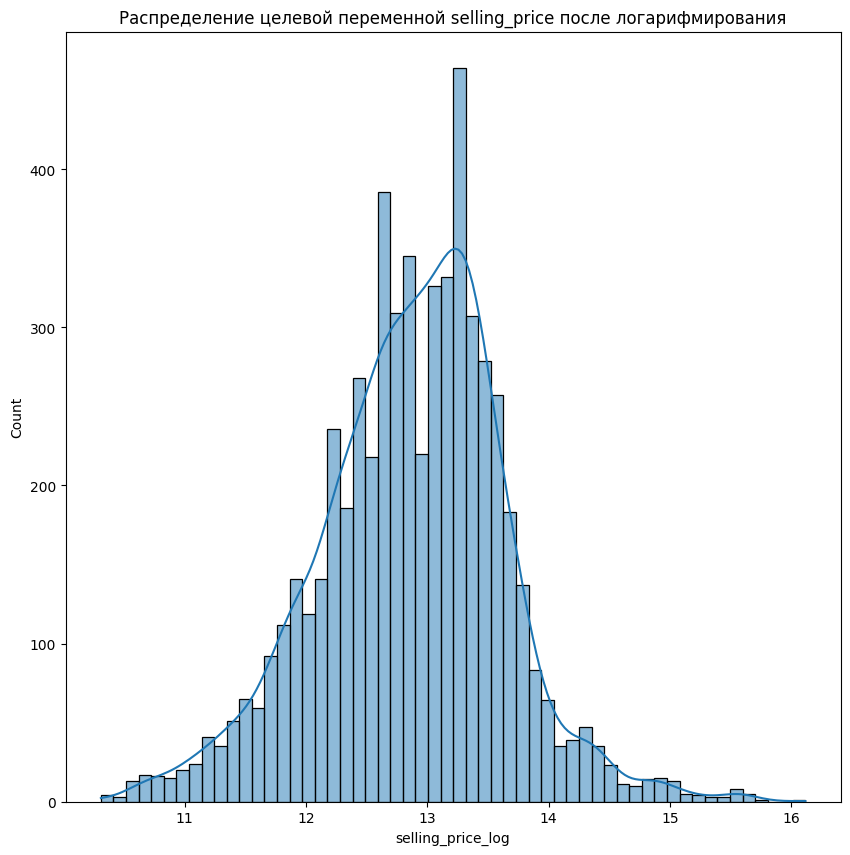

In [65]:
plt.figure(figsize=(10, 10))

sns.histplot(data=df_train, x='selling_price_log', kde=True)

plt.title('Распределение целевой переменной selling_price после логарифмирования')
plt.show()

Мое предположение, что логарифмирование целевой переменной может помочь приблизить ее распределение к нормальному, оказалось верно. Линия плотности распределения стала достаточно близкой к нормальному.

In [66]:
# Удалю selling_price_log, т.к. она не понадобится в дальнейшем
df_train.drop('selling_price_log', axis=1, inplace=True)

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [67]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5,190.00000,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5,250.00000,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5,2196.68960,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5,1127.76475,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5,11375.00000,4000.0


In [68]:
columns = list(df_train.select_dtypes('float').columns) + ['seats']
columns

['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'seats']

In [69]:
y_train = df_train['selling_price']
X_train = df_train[columns]

In [70]:
assert X_train.shape == (5840, 6)

In [71]:
y_test = df_test['selling_price']
X_test = df_test[columns]

In [72]:
assert X_test.shape == (1000, 6)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [X] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [X] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [73]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

preds_train_lr = lr_model.predict(X_train)
preds_test_lr = lr_model.predict(X_test)

In [74]:
lr_model.intercept_

np.float64(-1210742.4925802278)

In [75]:
r2_train_lr = r2_score(y_train, preds_train_lr)
mse_train_lr = MSE(y_train, preds_train_lr)

print(f"Train: R^2={r2_train_lr}, MSE={mse_train_lr}")

Train: R^2=0.5106415535484766, MSE=140268891952.26147


In [76]:
r2_test_lr = r2_score(y_test, preds_test_lr)
mse_test_lr = MSE(y_test, preds_test_lr)

print(f"Test: R^2={r2_test_lr}, MSE={mse_test_lr}")

Test: R^2=0.5337286102253029, MSE=268026109519.7192


**Выводы:** По значению метрики $R^2$ могу сделать вывод, что модель довольно слабая - всего 0.53. Значение в данный момент не позволяет судить о качестве модели, но он пригодится для ее сравнения с другими моделями.

### **Задание 13 (0.15 балла)**

- [X] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

Формула расчета метрики $R^2$ имеет следующий вид:
$$R^2=1-\frac{\sum_{i=1}^n (y_i - \hat{y}_i)^2}{\sum_{i=1}^n (y_i - \overline{y})^2}$$
, где $y_i$ - истинное значение целевой переменной, $\hat{y}_i$ - предсказанное моделью значение, $\overline{y}$ - среднее значение целевой переменной, n - количество наблюдений

In [77]:
def r2_manual(y_true, y_pred):
    # Если на вход поданы pd.Series, то преобразуем их в numpy array
    if isinstance(y_true, pd.Series):
        y_true = y_true.values
    if isinstance(y_pred, pd.Series):
        y_pred = y_pred.values
    
    ss_res = sum((y_true - y_pred)**2)
    ss_tot = sum((y_true - y_true.mean())**2)
    return 1 - ss_res / ss_tot

In [78]:
r2_manual(y_train, r2_train_lr), r2_manual(y_test, mse_test_lr)

(np.float64(-0.9541177372006298), np.float64(-124972330363.17358))

### **Бонус (0.15 балла)**

- [X] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [X] Объясните, когда применяется $\text{adjusted}-R^2$?

$$R_{adj}^2 = 1 - (1 - R^2) \frac{n - 1}{n - p - 1}$$

где n - количество наблюдений, p - количество параметров модели

In [79]:
def r2_adj(y_true, y_pred, n, p):
    return 1 - (1 - r2_manual(y_true, y_pred) * ((n - 1) / (n - p - 1)))

In [80]:
r2_adj(y_train, preds_train_lr, *list(X_train.shape)), r2_adj(y_test, preds_test_lr, *list(X_test.shape))

(np.float64(0.5111668148756343), np.float64(0.5369535565106517))

 При добавлении в модель новой независимой переменной доля объясненной дисперсии зависимой переменной возрастает. Можно было бы включить в модель как можно больше переменных, но на практике данный подход не дает хороших результатов, т.к. не гарантирует, что будут выбраны именно те переменные, которые вносят значимый вклад. Также падает отношение числа наблюдений к числу параметров модели, что повышает вероятность переобучения. $R_{adj}^2$ как раз и позволяет решить данную проблему путем ввода штрафа, увеличивающегося при добавлении в каждой новой переменной.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [X] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [81]:
std_scal = StandardScaler()

X_train = pd.DataFrame(data=std_scal.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(data=std_scal.transform(X_test), columns=X_test.columns)

In [82]:
X_train.head()

,mileage,engine,max_power,torque,max_torque_rpm,seats
0,0.995867,-0.373643,-0.438819,-0.257159,-1.147640,-0.434419
1,0.428830,0.141162,0.493632,-0.235331,-0.599393,-0.434419
2,0.895506,-0.068879,0.066574,0.472855,-0.325270,-0.434419
3,-0.835712,-0.270682,0.009718,0.083991,1.593594,-0.434419
4,0.177929,-0.478663,-0.190544,3.811836,1.045347,-0.434419


In [83]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

preds_train_lr_2 = lr_model.predict(X_train)
preds_test_lr_2  = lr_model.predict(X_test)

In [84]:
r2_train_lr_2  = r2_score(y_train, preds_train_lr_2 )
mse_train_lr_2  = MSE(y_train, preds_train_lr_2 )

print(f"Train: R^2={r2_train_lr_2 }, MSE={mse_train_lr_2 }")

Train: R^2=0.5106415535484766, MSE=140268891952.26147


In [85]:
r2_test_lr_2  = r2_score(y_test, preds_test_lr_2 )
mse_test_lr_2  = MSE(y_test, preds_test_lr_2 )

print(f"Test: R^2={r2_test_lr_2 }, MSE={mse_test_lr_2 }")

Test: R^2=0.5337286102253006, MSE=268026109519.72055


Качество модели осталось на прежнем уровне что по тренировочным, что по тестовым данным

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [X] Какой признак оказался наиболее информативным в предсказании цены?

In [86]:
X_train.columns

Index(['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'seats'], dtype='object')

In [87]:
lr_model.coef_

array([107012.18262266,  16850.64003787, 394348.81707128,  -1689.67611642,
       -11554.51690685,  19318.33170205])

In [88]:
X_train.columns[abs(lr_model.coef_).argmax()]

'max_power'

Для модели наиболее информативным оказался признак `max_power`

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [X] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [X] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [89]:
lasso_model = Lasso()
lasso_model.fit(X_train, y_train)

preds_train_ls = lasso_model.predict(X_train)
preds_test_ls = lasso_model.predict(X_test)

In [90]:
r2_train_ls = r2_score(y_train, preds_train_ls)
mse_train_ls = MSE(y_train, preds_train_ls)

print(f"Train: R^2={r2_train_ls}, MSE={mse_train_ls}")

Train: R^2=0.5106415534980897, MSE=140268891966.7043


In [91]:
r2_test_ls = r2_score(y_test, preds_test_ls)
mse_test_ls = MSE(y_test, preds_test_ls)

print(f"Test: R^2={r2_test_ls}, MSE={mse_test_ls}")

Test: R^2=0.5337281871170292, MSE=268026352734.43716


Применение Lasso регрессии также не дало какого либо прироста в качестве.

In [92]:
lasso_model.coef_, lasso_model.intercept_

(array([107013.5330092 ,  16857.94615832, 394344.497834  ,  -1688.86705088,
        -11552.59240578,  19314.67316295]),
 np.float64(522960.0910958905))

Модель не занулила ни один из весов. Думаю, это связано с тем, что все признаки модели - информативные и в носят существенный вклад в предсказание модели.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [X] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [X] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [93]:
params_grid_ls = {
    'alpha': np.arange(0.5, 4.1, 0.5),
    'positive': [False, True],
    'max_iter': list(range(500, 2001, 100))
}

In [94]:
lasso_model_gd = Lasso()
gdcv_ls = GridSearchCV(estimator=lasso_model_gd, param_grid=params_grid_ls, scoring='r2', cv=10, n_jobs=-1)
gdcv_ls.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. ]),
                         'max_iter': [500, 600, 700, 800, 900, 1000, 1100, 1200,
                                      1300, 1400, 1500, 1600, 1700, 1800, 1900,
                                      2000],
                         'positive': [False, True]},
             scoring='r2')

In [95]:
sum([len(el) for el in params_grid_ls.values()])

26

In [96]:
gdcv_ls.best_score_

np.float64(0.4721454725138883)

In [97]:
lasso_best_params = gdcv_ls.best_params_
lasso_best_params

{'alpha': np.float64(4.0), 'max_iter': 500, 'positive': True}

**Ответы на вопросы**  
**Сколько грид-сёрчу пришлось обучать моделей?**  
Для каждого из наборов проверяемых параметров GridSearchCV пришлось обучить по 10 моделей. Значит общее количество обученных моделей будет равняться 10 * количество параметров в `params_grid`. В моем случае это 10 * 26 = 260 моделей.  
**Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый**  
alpha - коэффициент регуляризации  
positive - Если True, то модель старается сделать так, чтобы все веса были положительными 
max_iter - ограничение по количеству итераций при обучении модели
**Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?**  
Коэффициент регуляризации равен 4

**Ваша задача 2:**

- Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для ElasticNet регрессии.
- Ответьте на вопрос:
- Сколько грид-сёрчу пришлось обучать моделей?
- Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [98]:
params_grid = {
    'alpha': np.arange(0.5, 4.1, 0.5),
    'l1_ratio': np.arange(0.1, 1, 0.1),
    'max_iter': list(range(500, 2001, 100))
}

In [99]:
en_model = ElasticNet()
gdcv_en = GridSearchCV(estimator=en_model, param_grid=params_grid, scoring='r2', cv=10, n_jobs=-1)
gdcv_en.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. ]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_iter': [500, 600, 700, 800, 900, 1000, 1100, 1200,
                                      1300, 1400, 1500, 1600, 1700, 1800, 1900,
                                      2000]},
             scoring='r2')

In [100]:
sum([len(el) for el in params_grid.values()])

33

In [101]:
gdcv_en.best_score_

np.float64(0.47843300264769023)

In [102]:
best_model = gdcv_en.best_estimator_

In [103]:
elasticnet_best_params = gdcv_en.best_params_

In [104]:
best_model.coef_

array([ 89582.06826836,  55554.49819131, 332498.78976209,    538.4339975 ,
        -9379.6583842 ,   1652.3661528 ])

In [105]:
best_model.get_params()

{'alpha': np.float64(1.0),
 'copy_X': True,
 'fit_intercept': True,
 'l1_ratio': np.float64(0.9),
 'max_iter': 500,
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}

**Ответы на вопросы**  
**Сколько грид-сёрчу пришлось обучать моделей?**  
Для каждого из наборов проверяемых параметров GridSearchCV пришлось обучить по 10 моделей. Значит общее количество обученных моделей будет равняться 10 * количество параметров в `params_grid`. В моем случае это 10 * 33 = 330 моделей.  
  
**Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?**  
```
{'alpha': np.float64(1.0),  
'copy_X': True,  
'fit_intercept': True,  
'l1_ratio': np.float64(0.9),  
'max_iter': 500,  
'positive': False,  
'precompute': False,  
'random_state': None,  
'selection': 'cyclic',  
'tol': 0.0001,  
'warm_start': False}
```

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [X] Реализуйте модель с $L0$-регуляризаицей.
- [X] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [X] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



$$L_0 = Q(w) + \lambda \sum_{i=1}^l [w_i \neq 0] \rightarrow \underset{w}{min}$$

In [106]:
def mse_with_l0(estimator, X, y, alpha=1000.0):
    weights = estimator.coef_
    l0 = alpha * sum(weights != 0)
    preds = estimator.predict(X)
    mse = ((y - preds) ** 2).mean()
    return -(mse + l0)

In [107]:
en_model_l0 = ElasticNet()
gdcv_en_l0 = GridSearchCV(estimator=en_model_l0, param_grid=params_grid, scoring=mse_with_l0, cv=10, n_jobs=-1)
gdcv_en_l0.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. ]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_iter': [500, 600, 700, 800, 900, 1000, 1100, 1200,
                                      1300, 1400, 1500, 1600, 1700, 1800, 1900,
                                      2000]},
             scoring=<function mse_with_l0 at 0x78b871c97560>)

In [108]:
gdcv_en_l0.best_params_

{'alpha': np.float64(0.5), 'l1_ratio': np.float64(0.9), 'max_iter': 500}

In [109]:
gdcv_en_l0.best_score_

np.float64(-144220441528.89087)

Полноценно интегрировать $L_0$ регуляризацию в обучение модели без ее переписывания самостоятельно не получится, поэтому использовал метрику MSE с добавленной регуляризацией как метрику скоринга в GridSearchCV. По требованиям GridSearchCV считается, что чкем больше значение, тем лучше. Поэтому результат метрики делаю отрицательным.  
Т.к. тут использована MSE - результат получился малоинтерпретируемым, но точно могу сказать, что качество модели не очень, т.к. по модулю значение `gdcv_en_l0.best_score_` очень большое. Даже с учетом квадратичности MSE видно, что ошибка большая.  
Про саму регуляризацию $L_0$. Т.к. в ней подсчитывается только количество ненулевых весов, при большой ошибке она вносит минимальный вклад в общий результат, даже при большом коэффициенте `alpha`. В коде не видно, но пробовал различные значения `alpha` от 1 до 1000000, но при `alpha=1000000` были незначительные отличия в итоговом `gdcv_en_l0.best_score_` на уровне тысяч - десятков тысяч, что при текущем результате является незначительным.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [X] Предобработайте столбец `name`, чтобы избежать его удаления

In [110]:
# Отбираю категориальные фичи из df_train для дальнейшего их кодирования. Добавляю к ним также вещественные признаки, которые мы добавляли в X_train

X_train_cat = df_train.select_dtypes(include='object')
X_train_cat = pd.concat([X_train_cat, df_train[X_train.columns]], axis=1)
X_train_cat.head()

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,max_torque_rpm,seats
0,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00000,2000.0,5
1,Skoda Rapid 1.5 TDI Ambition,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00000,2500.0,5
2,Hyundai i20 Sportz Diesel,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,2196.68960,2750.0,5
3,Maruti Swift VXI BSIII,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,1127.76475,4500.0,5
4,Hyundai Xcent 1.2 VTVT E Plus,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,11375.00000,4000.0,5


In [111]:
# Оставляю в столбце `name` только марки машин
X_train_cat['name'] = X_train_cat['name'].str.split().apply(lambda val: val[0])
X_train_cat.head()

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,max_torque_rpm,seats
0,Maruti,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00000,2000.0,5
1,Skoda,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00000,2500.0,5
2,Hyundai,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,2196.68960,2750.0,5
3,Maruti,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,1127.76475,4500.0,5
4,Hyundai,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,11375.00000,4000.0,5


In [112]:
X_train_cat['name'].nunique()

30

In [113]:
# Т.к. получилось 30 уникальных марок, использую OrdinalEncoder для кодирования признака
oe = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X_train_cat['name'] = oe.fit_transform(X_train_cat[['name']])
X_train_cat['name'] = X_train_cat['name'].astype('int')
X_train_cat.head()

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,max_torque_rpm,seats
0,19,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00000,2000.0,5
1,25,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00000,2500.0,5
2,10,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,2196.68960,2750.0,5
3,19,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,1127.76475,4500.0,5
4,10,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,11375.00000,4000.0,5


In [114]:
X_train_cat['name'].min()

np.int64(0)

In [115]:
assert X_train_cat.shape == (5840, 11)

In [116]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


In [117]:
X_test_cat = df_test.select_dtypes(include='object')
X_test_cat = pd.concat([X_test_cat, df_test[X_test.columns]], axis=1)
X_test_cat['name'] = X_test_cat['name'].str.split().apply(lambda val: val[0])
X_test_cat['name'] = oe.transform(X_test_cat[['name']])
X_test_cat['name'] = X_test_cat['name'].astype('int')
X_test_cat.head()

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,max_torque_rpm,seats
0,18,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,260.0,2200.0,7
1,26,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,260.0,2750.0,5
2,9,Petrol,Individual,Automatic,First Owner,12.9,1799.0,130.0,172.0,4300.0,5
3,9,Diesel,Individual,Manual,First Owner,25.1,1498.0,98.6,200.0,1750.0,5
4,26,Petrol,Individual,Manual,Second Owner,16.5,1172.0,65.0,96.0,3000.0,5


### **Задание 20 (0.1 балла)**

- [X] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [118]:
cols_to_transform = list(X_train_cat.select_dtypes(include='object').columns) + ['seats']
cols_to_transform

['fuel', 'seller_type', 'transmission', 'owner', 'seats']

In [119]:
ohe = OneHotEncoder(drop='first')
encoded_cols = pd.DataFrame(data=ohe.fit_transform(X_train_cat[cols_to_transform]).toarray(), columns=ohe.get_feature_names_out())
X_train_cat = pd.concat([X_train_cat.drop(cols_to_transform, axis=1), encoded_cols], axis=1)
X_train_cat.head()

,name,mileage,engine,max_power,torque,max_torque_rpm,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,19,23.40,1248.0,74.00,190.00000,2000.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25,21.14,1498.0,103.52,250.00000,2500.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10,23.00,1396.0,90.00,2196.68960,2750.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,19,16.10,1298.0,88.20,1127.76475,4500.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10,20.14,1197.0,81.86,11375.00000,4000.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [120]:
encoded_cols = pd.DataFrame(data=ohe.transform(X_test_cat[cols_to_transform], ).toarray(), columns=ohe.get_feature_names_out())
X_test_cat = pd.concat([X_test_cat.drop(cols_to_transform, axis=1), encoded_cols], axis=1)
X_test_cat.head()

,name,mileage,engine,max_power,torque,max_torque_rpm,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,18,14.0,2498.0,112.0,260.0,2200.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,26,21.5,1497.0,108.5,260.0,2750.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,9,12.9,1799.0,130.0,172.0,4300.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,9,25.1,1498.0,98.6,200.0,1750.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,26,16.5,1172.0,65.0,96.0,3000.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

**Как корректно работать с OHE преобразованием?**  
Т. к. OHE создает новые столбцы с бинарными данными, то стоит использовать его только если у категориального признака не очень много категорий. В противном случае получится разреженная матрица с большим количиством нулей и из-за этого модель может переобучиться.  
  
**Почему мы удаляем один столбец?**  
Чтобы избежать линейной зависимости между закодированными столбцами и единичным вектором весов свободного члена линейной регрессии, т.к. закодированные OHE столбцы каждого признака в сумме дают единичный столбец. Удаление одного из столбцов при кодировании не влияет на результат, т.к. мы по прежнему можем однозначно определить каждую категорию по оставшимся столбцам (если во всех столбцах значения равны нулю, то это категория из удаленного столбца), но при этом мы избегаем линейной этой зависимости.  
  
**Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?**  
Это будет не корректно. С одной стороны, их стоило бы удалить для уменьшения размерности датафрейма, т.к. они всё равно не вносят вклад в результат. Но т.к. после преобразования мы получили $n-1$ столбец, то если мы удалим неважные признаки, станет невозможно определить категорию из удаленного при кодировании столбца (см. мой предыдущий ответ).

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [X] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [X] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [121]:
# Т.к. в датасете появились призначки со значениями 0 и 1, то нормирую датасет с помошью MinMaxScaler

mms = MinMaxScaler()
X_train_cat = pd.DataFrame(data=mms.fit_transform(X_train_cat), columns=X_train_cat.columns)
X_test_cat = pd.DataFrame(data=mms.transform(X_test_cat), columns=X_test_cat.columns)
X_train_cat.head()

,name,mileage,engine,max_power,torque,max_torque_rpm,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,0.655172,0.557143,0.209396,0.18500,0.003189,0.029412,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.862069,0.503333,0.293289,0.25880,0.004565,0.053922,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.344828,0.547619,0.259060,0.22500,0.049227,0.066176,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.655172,0.383333,0.226174,0.22050,0.024703,0.151961,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.344828,0.479524,0.192282,0.20465,0.259796,0.127451,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [122]:
ridge_model = Ridge()

param_grid = {
    'alpha': np.arange(0.1, 3.1, 0.1)
}
gscv_rn = GridSearchCV(estimator=ridge_model, param_grid=param_grid, scoring='r2', cv=10, n_jobs=-1)
gscv_rn.fit(X_train_cat, y_train)

GridSearchCV(cv=10, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6,
       2.7, 2.8, 2.9, 3. ])},
             scoring='r2')

In [123]:
gscv_rn.best_score_

np.float64(0.5643719126484341)

In [124]:
ringe_best_params = gscv_rn.best_params_

In [125]:
gscv_rn.best_score_ - gdcv_en.best_score_

np.float64(0.08593891000074388)

**Удалось ли улучшить качество прогнозов?**
Да, по сравнению с моделью ElasticNet удалось улучшить качество на 0.086

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

Для удобста проверки результатов feature engineering, написал функцию `calculate_all_models`, которая по очереди делает `greedsearch` (функция `fit_best_model`) моделей `Ridge`, `Lasso` и `ElasticNet` и оценивает результаты на тесте. Результатов работы функции является словарь с обученными моделями, их предсказаниями и значениями метрик `R^2` и `MSE`.

In [126]:
def fit_best_model(X, y, model, param_grid):
    gdcv = GridSearchCV(estimator=model, param_grid=param_grid, scoring='r2', cv=10, n_jobs=-1)
    gdcv.fit(X, y)
    return gdcv.best_estimator_


def calculate_all_models(X_train, y_train, X_test, y_test, log_target=False):
    """Обучает модели `Ridge`, `Lasso` и `ElasticNet` и возвращает лучшие"""
    params_grid_en = {
        'alpha': np.arange(0.5, 4.1, 0.5),
        'l1_ratio': np.arange(0.1, 1, 0.1),
        'positive': [False, True],
        'max_iter': list(range(500, 2001, 100))
    }
    params_grid_rl = {
        'alpha': np.arange(0.5, 4.1, 0.5),
        'positive': [False, True],
        'max_iter': list(range(500, 2001, 100))
    }
    metrics = {}

    if log_target:
        y_train = np.log(y_train)

    # Ridge
    model_ridge = fit_best_model(X_train, y_train, Ridge(), params_grid_rl)
    preds_ringe = model_ridge.predict(X_test)
    if log_target:
        preds_ringe = np.exp(preds_ringe)
    metrics['Ridge'] = {
        'model': model_ridge,
        'predictions': preds_ringe,
        'R2': r2_score(y_test, preds_ringe),
        'MSE': MSE(y_test, preds_ringe)
    }
    print('Ringe model is calculated')

    # Lasso
    model_lasso = fit_best_model(X_train, y_train, Lasso(), params_grid_rl)
    preds_lasso = model_lasso.predict(X_test)
    if log_target:
        preds_lasso = np.exp(preds_lasso)
    metrics['Lasso'] = {
        'model': model_lasso,
        'predictions': preds_lasso,
        'R2': r2_score(y_test, preds_lasso),
        'MSE': MSE(y_test, preds_lasso)
    }
    print('Lasso model is calculated')

    # ElasticNet
    model_elastic = fit_best_model(X_train, y_train, ElasticNet(), params_grid_en)
    preds_elastic = model_elastic.predict(X_test)
    if log_target:
        preds_elastic = np.exp(preds_elastic)
    metrics['ElasticNet'] = {
        'model': model_elastic,
        'predictions': preds_elastic,
        'R2': r2_score(y_test, preds_elastic),
        'MSE': MSE(y_test, preds_elastic)
    }
    print('ElasticNet model is calculated')

    return metrics    

In [127]:
poly_cols = ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']
ohe_cols = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']

In [128]:
# Добавлю полиномиальные фичи с помощью PolynomialFeatures

# Отбираю фичи для последующей предобработки
X_train_pol = df_train.select_dtypes(include='object')
X_train_pol = pd.concat([X_train_pol, df_train[X_train.columns]], axis=1)

# Кодирую признак name с помощью OrdinalEncoder как я это делал ранее
X_train_pol['name'] = X_train_pol['name'].str.split().apply(lambda val: val[0])
oe = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X_train_pol['name'] = oe.fit_transform(X_train_pol[['name']])
X_train_pol['name'] = X_train_pol['name'].astype('int')

# Добавляю полиноминальные фичи
plf = PolynomialFeatures(degree=2)
plf.fit(X_train_pol[poly_cols])
X_train_pol = pd.concat([
    X_train_pol,
    pd.DataFrame(data=plf.transform(X_train_pol[poly_cols]), columns=plf.get_feature_names_out()).drop(poly_cols + ['1'], axis=1)
], axis=1)

# Кодирую категориальные переменные с помощью OneHotEncoder
ohe = OneHotEncoder(drop='first')
encoded_cols_train = pd.DataFrame(data=ohe.fit_transform(X_train_pol[ohe_cols]).toarray(), columns=ohe.get_feature_names_out())
X_train_pol = pd.concat([X_train_pol.drop(ohe_cols, axis=1), encoded_cols_train], axis=1)

# Проделываю аналогичные преобразования с тестовыми данными
X_test_pol = df_test.select_dtypes(include='object')
X_test_pol = pd.concat([X_test_pol, df_test[X_test.columns]], axis=1)
X_test_pol['name'] = X_test_pol['name'].str.split().apply(lambda val: val[0])
X_test_pol['name'] = oe.transform(X_test_pol[['name']])
X_test_pol['name'] = X_test_pol['name'].astype('int')
X_test_pol = pd.concat([
    X_test_pol,
    pd.DataFrame(data=plf.transform(X_test_pol[poly_cols]), columns=plf.get_feature_names_out()).drop(poly_cols + ['1'], axis=1)
], axis=1)
encoded_cols_test = pd.DataFrame(data=ohe.fit_transform(X_test_pol[ohe_cols]).toarray(), columns=ohe.get_feature_names_out())
X_test_pol = pd.concat([X_test_pol.drop(ohe_cols, axis=1), encoded_cols_test], axis=1)

# Добавляю недостающие в тесте столбцы
cols_to_add = list(set(X_train_pol.columns) - set(X_test_pol.columns))
X_test_pol[cols_to_add] = 0
X_test_pol = X_test_pol[X_train_pol.columns]

# Маштабирую данные с помощью MinMaxScaler
mms = MinMaxScaler()
X_train_pol = pd.DataFrame(data=mms.fit_transform(X_train_pol), columns=X_train_pol.columns)
X_test_pol = pd.DataFrame(data=mms.transform(X_test_pol), columns=X_test_pol.columns)

X_train_pol.head()

,name,mileage,engine,max_power,torque,max_torque_rpm,mileage^2,mileage engine,mileage max_power,mileage torque,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,0.655172,0.557143,0.209396,0.18500,0.003189,0.029412,0.310408,0.353131,0.103071,0.007112,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.862069,0.503333,0.293289,0.25880,0.004565,0.053922,0.253344,0.382932,0.130263,0.008454,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.344828,0.547619,0.259060,0.22500,0.049227,0.066176,0.299887,0.388256,0.123214,0.080819,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.655172,0.383333,0.226174,0.22050,0.024703,0.151961,0.146944,0.252700,0.084525,0.029044,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.344828,0.479524,0.192282,0.20465,0.259796,0.127451,0.229943,0.291513,0.098135,0.366460,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [129]:
# Сохраняю все обученные модели препроцессинга данных для использования их в приложении streamlit
with open('./models/ordinal_encoder.pkl', 'wb') as f:
    pickle.dump(oe, f)

with open('./models/one_hot_encoder.pkl', 'wb') as f:
    pickle.dump(ohe, f)

with open('./models/min_max_scaler.pkl', 'wb') as f:
    pickle.dump(mms, f)

with open('./models/polynominal_features.pkl', 'wb') as f:
    pickle.dump(plf, f)

In [130]:
# Сохраняю списки столбцов 
with open('./data/columns.json', 'w') as f:
    json.dump(list(X_test.columns), f)

with open('./data/final_columns.json', 'w') as f:
    json.dump(list(X_train_pol.columns), f)

In [131]:
res_polynominal = calculate_all_models(X_train_pol, y_train, X_test_pol, y_test)

Ringe model is calculated


/home/rattler/HSE/Homeworks/hse_machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.310e+14, tolerance: 1.479e+11
  model = cd_fast.enet_coordinate_descent(
/home/rattler/HSE/Homeworks/hse_machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.391e+14, tolerance: 1.564e+11
  model = cd_fast.enet_coordinate_descent(
/home/rattler/HSE/Homeworks/hse_machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the nu

Lasso model is calculated
ElasticNet model is calculated


In [133]:
{key: values['R2'] for key, values in res_polynominal.items()}

{'Ridge': 0.6494210979308513,
 'Lasso': 0.66109976060219,
 'ElasticNet': 0.4410709974314838}

In [134]:
{key: values['MSE'] for key, values in res_polynominal.items()}

{'Ridge': 201522763913.72037,
 'Lasso': 194809535118.56613,
 'ElasticNet': 321288351250.8965}

In [157]:
res_polynominal['Lasso']['R2'] - gscv_rn.best_score_

np.float64(0.09672784795375589)

In [135]:
res_polynominal['Ridge']['R2'] - gscv_rn.best_score_

np.float64(0.08504918528241723)

В этом случае лучший результат показала моедль `Lasso` с результатом 0.66. Это на 0.096 пункта выше, чем предыдущая лучшая модель `Ridge`.

Добавлю еще бинарный признак, что значение в признака было заполнено медианным

In [136]:
for col, mask in na_values_mask_train.items():
    X_train_pol[f"is_nan_val_{col}"] = mask.astype('int')

for col, mask in na_values_mask_test.items():
    X_test_pol[f"is_nan_val_{col}"] = mask.astype('int')

In [137]:
X_train_pol.head()

,name,mileage,engine,max_power,torque,max_torque_rpm,mileage^2,mileage engine,mileage max_power,mileage torque,...,seats_8,seats_9,seats_10,seats_14,is_nan_val_mileage,is_nan_val_engine,is_nan_val_max_power,is_nan_val_seats,is_nan_val_torque,is_nan_val_max_torque_rpm
0,0.655172,0.557143,0.209396,0.18500,0.003189,0.029412,0.310408,0.353131,0.103071,0.007112,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
1,0.862069,0.503333,0.293289,0.25880,0.004565,0.053922,0.253344,0.382932,0.130263,0.008454,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
2,0.344828,0.547619,0.259060,0.22500,0.049227,0.066176,0.299887,0.388256,0.123214,0.080819,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
3,0.655172,0.383333,0.226174,0.22050,0.024703,0.151961,0.146944,0.252700,0.084525,0.029044,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
4,0.344828,0.479524,0.192282,0.20465,0.259796,0.127451,0.229943,0.291513,0.098135,0.366460,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0


In [138]:
res_polynominal_2 = calculate_all_models(X_train_pol, y_train, X_test_pol, y_test)

Ringe model is calculated


/home/rattler/HSE/Homeworks/hse_machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.222e+14, tolerance: 1.521e+11
  model = cd_fast.enet_coordinate_descent(
/home/rattler/HSE/Homeworks/hse_machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.321e+14, tolerance: 1.564e+11
  model = cd_fast.enet_coordinate_descent(
/home/rattler/HSE/Homeworks/hse_machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the nu

Lasso model is calculated
ElasticNet model is calculated


In [139]:
{key: values['R2'] for key, values in res_polynominal_2.items()}

{'Ridge': 0.6740570858201539,
 'Lasso': 0.6786598349726478,
 'ElasticNet': 0.4420522397012101}

In [140]:
{key: values['MSE'] for key, values in res_polynominal_2.items()}

{'Ridge': 187361294578.58636,
 'Lasso': 184715502931.29218,
 'ElasticNet': 320724305174.25836}

In [158]:
res_polynominal_2['Lasso']['R2'] - res_polynominal['Lasso']['R2']

0.017560074370457812

In [141]:
res_polynominal_2['Ridge']['R2'] - res_polynominal['Ridge']['R2']

0.024635987889302546

Качество модели `Lasso` выросло еще на 0.017 пункта. При этом качество Ringe приблизилось к Lasso.  
  
Теперь попробую поработать с целевой переменной. На одной из визуализация я показал, что если ее прологарифмировать, то ее распределение станет ближе к нормальному. Пролагорифмирую целевую переменную.  
Для удобства добавил возможность логарифмирования целевой переменной трейна и последующего экспонинцирования предсказания прямо в функцию `calculate_all_models` - за это отвечает параметр `log_target`.

In [142]:
res_polynominal_3 = calculate_all_models(X_train_pol, y_train, X_test_pol, y_test, log_target=True)

Ringe model is calculated
Lasso model is calculated
ElasticNet model is calculated


In [143]:
{key: values['R2'] for key, values in res_polynominal_3.items()}

{'Ridge': 0.714533678780211,
 'Lasso': -0.09133890866571726,
 'ElasticNet': -0.05546415043719133}

In [156]:
{key: values['MSE'] for key, values in res_polynominal_3.items()}

{'Ridge': 164094193110.1915,
 'Lasso': 627332768580.3503,
 'ElasticNet': 606710933123.9685}

In [144]:
res_polynominal_3['Ridge']['R2'] - res_polynominal_2['Ridge']['R2']

0.04047659296005712

Получился интересный результат:  
- При обучении Lasso-регрессии перестали выводиться предупреждения, что тагрет не сходится
- Модели Lasso и ElasticNet стали предсказывать хуже, чем обычное среднее - значение $R^2 < 0$. Но при этом Ridge-регрессия улучшила свой результат на 0.04 пункта.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [X] Реализуйте метрику `business_metric`
- [X] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [145]:
def business_metrics(y_true, y_pred):
    biases = (y_true - y_pred).abs() / y_true <= 0.10
    return biases.sum() / len(biases)

In [146]:
# Ridge
ridge_model = Ridge(**ringe_best_params)
ridge_model.fit(X_train_cat, y_train)
preds_ridge = ridge_model.predict(X_test_cat)
business_metrics(y_test, preds_ridge)

np.float64(0.179)

In [147]:
# Lasso
lasso_model = Lasso(**lasso_best_params)
lasso_model.fit(X_train_cat, y_train)
preds_lasso = lasso_model.predict(X_test_cat)
business_metrics(y_test, preds_lasso)

np.float64(0.171)

In [148]:
# ElasticNet
elasticnet_model = ElasticNet(**elasticnet_best_params)
elasticnet_model.fit(X_train_cat, y_train)
preds_elasticnet= elasticnet_model.predict(X_test_cat)
business_metrics(y_test, preds_elasticnet)

np.float64(0.159)

In [149]:
# Модель Ridge также показала себя лучше всего на кросс валидации, поэтому сохраняю ее веса в pickle-файл для последующего инференса
with open('./models/ridge_model.pkl', 'wb') as f:
    pickle.dump(ridge_model, f)

In [150]:
# Также сохраняю список признаков отдельно для удобства использования в 5 задании
with open('./data/feature_names.pkl', 'wb') as f:
    pickle.dump(ridge_model.feature_names_in_, f, protocol=pickle.HIGHEST_PROTOCOL)

In [151]:
# Сохраняю подготовленный тестовый датасет
X_test_cat_to_save = X_test_cat.copy()
X_test_cat_to_save['selling_price'] = y_test
X_test_cat_to_save.to_csv('cars_test_full.csv', index=False)

Лучше всего справилась модель Ridge. У нее получилось наибольшая доля - 0.179 по бизнес метрике 

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [X] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [X] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



Главная цель бизнеса - это получение прибыли. Поэтому в качестве бизнес-метрики рассчитаю прибыль от продажи автомобилей по спрогнозированной цены. 

In [152]:
def your_business_metrics(y_true, y_pred):
    """Прибыль"""
    return (y_pred - y_true).mean()

In [153]:
# Ridge
your_business_metrics(y_test, preds_ridge)

np.float64(-43400.86470672029)

In [154]:
# Lasso
your_business_metrics(y_test, preds_lasso)

np.float64(-50894.37760868068)

In [155]:
# ElasticNet
your_business_metrics(y_test, preds_elasticnet)

np.float64(-68398.74912984403)

Судя по получившимся метрикам лучшая модель Rigde сгенерирует убыток от продажи автомобилей по спрогнозированной цене в размере 43345.72 по сравнению с их истинной ценой.  
С другой стороны, как я понимаю, прямое прогнозирование цены товара не является корректным, т.к. таким образом мы сами себя в перспективе загоняем в ловушку собственных прогнозов. Т.е. мы прогнозируем цены, продаем по ним товары и потом на результатах продаж на наших прогнозах продолжаем строить дальнейшие прогнозы. Это приводит к накоплению ошибки прогнозирования в течении всего времени использования модели.
Сам я никогда не занимался задачей динамического ценообразования на работе, но в теории изучал, что динамического ценообразования стоятся в основном как задача оптимизации спроса от сетки цен или наценок/дисконта и в них цена товара. Т.о. мы прогнозируем не саму цену, а какой будет спрос на товар при разныц ценах - тут цена выступает как ключевая, но не единственная фича для модели. А дальше решается задача оптимизации - выбрать оптимальные цены из использованных при прогнорзоровании.

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 25**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

`.md` файл с выводами и `.pickle` с моделью выложу в репозиторий с 2 частью задания вместе с `Streamlit`.